# Radiometry Class

In [1]:
%load_ext autoreload
%autoreload 2

# now, import the necessary packages
from pathlib import Path
from datetime import timedelta

# finally, import the RadiometryMDB class
from RadiometryTrios import Radiometry

To check the documentation of the classes and methods, we can use the '?' after the command:

In [2]:
Radiometry?

Init signature: Radiometry(path, r_type, data, metadata, logger=None, logger_level=20)
Docstring:      The radiometry class represent one radiometry (radiance or irradiance).
Init docstring: To open a Radiometry from file, use Radiometry.open() method.
File:           d:\onedrive - agência nacional de águas\projects\radiometrytrios\radiometrytrios\radiometry.py
Type:           type
Subclasses:     


## Opening a radiometry file

In the last notebook, we exported some radiometries (reflectance, Ed, Ld and Lu) from the MDB using the `TriosMDB` class. Let's now open one of the radiometries it using the Radiometry class.

In [55]:
rd = Radiometry.open('../mdbs/20151114-1439/Rrs_spectrum_LO.txt', r_type='Rrs')
rd

Radiometry Rrs:raw with 12/12 (not filtered)

In [56]:
rd.metadata

,key,value
0,IDDevice,SAM_83AE
1,IDDataType,SPECTRUM
2,IDDataTypeSub1,CALCULATED
3,IDDataTypeSub2,NaN
4,IDDataTypeSub3,NaN
5,RecordType,0
6,IDMethodType,DoubleSpecCalc
7,MethodName,DoubleSpecCalc_2
8,IntegrationTime,128
9,Unit1,$01 $01 Wavelength nm


## Plotting spectra

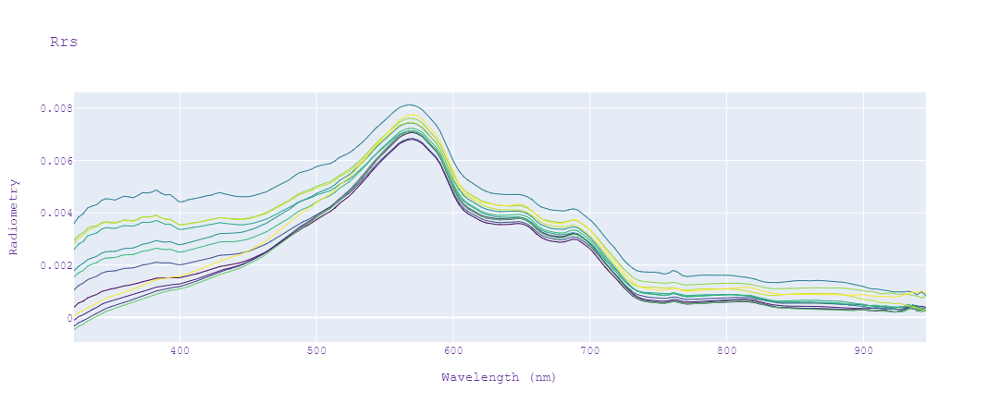

In [57]:
rd.plot()

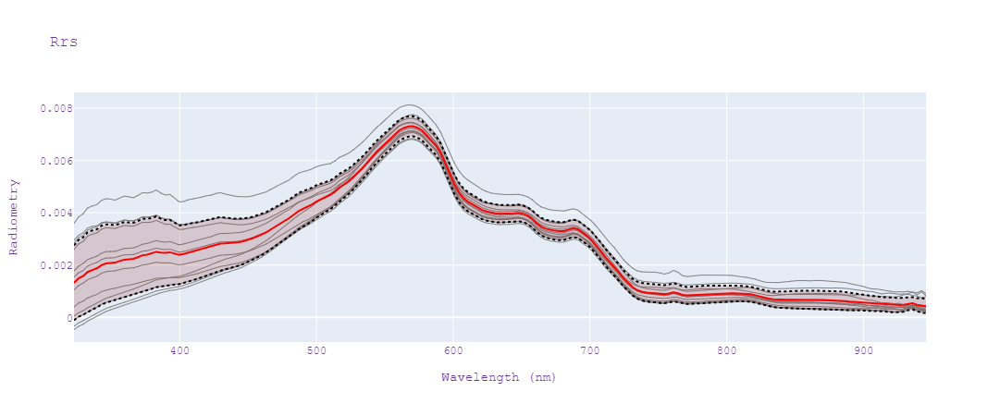

In [58]:
rd.plot(mean=True, std_delta=1.0)

## Filtering/cleaning Data

One of the most important features of the `Radiometry` class, is the possibility to quickly filter the curves by time or values, accumulating the filters and displaying the results. Two class members are important to understand. `Radiometry.times` and `Radiometry.subset`.<br>
* `Radiometry.times`: The `.times` member returns all the times that are currently loaded. By default, it returns the datetimes present in the intrepolated radiometries, otherwise it searches for the datetimes in the raw radiometries.
* `Radiometry.subset`: The `.subset` member represents the currently selected times that can be used to plot or to export if `use_subset` flag is on. If no subset is defined, all the series is provided.

In [28]:
rd.times

DatetimeIndex(['2015-11-14 14:39:45', '2015-11-14 14:39:55',
               '2015-11-14 14:40:05', '2015-11-14 14:40:15',
               '2015-11-14 14:40:25', '2015-11-14 14:40:35',
               '2015-11-14 14:40:45', '2015-11-14 14:40:55',
               '2015-11-14 14:41:05', '2015-11-14 14:41:15',
               '2015-11-14 14:41:25', '2015-11-14 14:41:35',
               '2015-11-14 14:41:45', '2015-11-14 14:41:55',
               '2015-11-14 14:42:05', '2015-11-14 14:42:15',
               '2015-11-14 14:42:25', '2015-11-14 14:42:35',
               '2015-11-14 14:42:45', '2015-11-14 14:42:55',
               '2015-11-14 14:43:05', '2015-11-14 14:43:15',
               '2015-11-14 14:43:25', '2015-11-14 14:43:35',
               '2015-11-14 14:43:45', '2015-11-14 14:43:55',
               '2015-11-14 14:44:05', '2015-11-14 14:44:15',
               '2015-11-14 14:44:25', '2015-11-14 14:44:35',
               '2015-11-14 14:44:45', '2015-11-14 14:44:55',
               '2015-11-

In [23]:
rd.apply_time_filter(start='2015-11-14 14:42:05', interval=timedelta(minutes=1))

DatetimeIndex(['2015-11-14 14:41:05', '2015-11-14 14:41:15',
               '2015-11-14 14:41:25', '2015-11-14 14:41:35',
               '2015-11-14 14:41:45', '2015-11-14 14:41:55',
               '2015-11-14 14:42:05', '2015-11-14 14:42:15',
               '2015-11-14 14:42:25', '2015-11-14 14:42:35',
               '2015-11-14 14:42:45', '2015-11-14 14:42:55',
               '2015-11-14 14:43:05'],
              dtype='datetime64[ns]', name='DateTime', freq='10S')

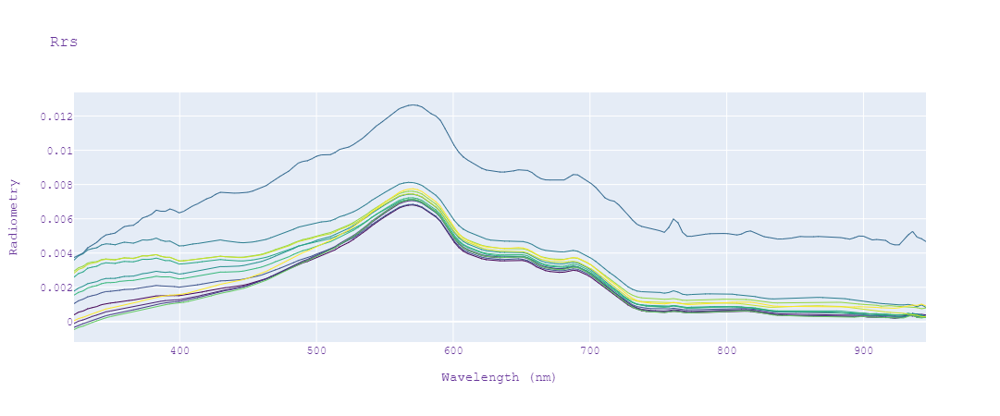

In [25]:
rd.plot(use_subset=True)

If we want to filter even further, we can accumulate the previous filter (subset) with other filters by value, for example. Note that the subset is applied to all radiometries, and appears in all plots.

In [26]:
rd.apply_value_filter(max_value=0.01, accumulate=True)

DatetimeIndex(['2015-11-14 14:41:05', '2015-11-14 14:41:15',
               '2015-11-14 14:41:25', '2015-11-14 14:41:35',
               '2015-11-14 14:41:55', '2015-11-14 14:42:05',
               '2015-11-14 14:42:15', '2015-11-14 14:42:25',
               '2015-11-14 14:42:35', '2015-11-14 14:42:45',
               '2015-11-14 14:42:55', '2015-11-14 14:43:05'],
              dtype='datetime64[ns]', name='DateTime', freq=None)

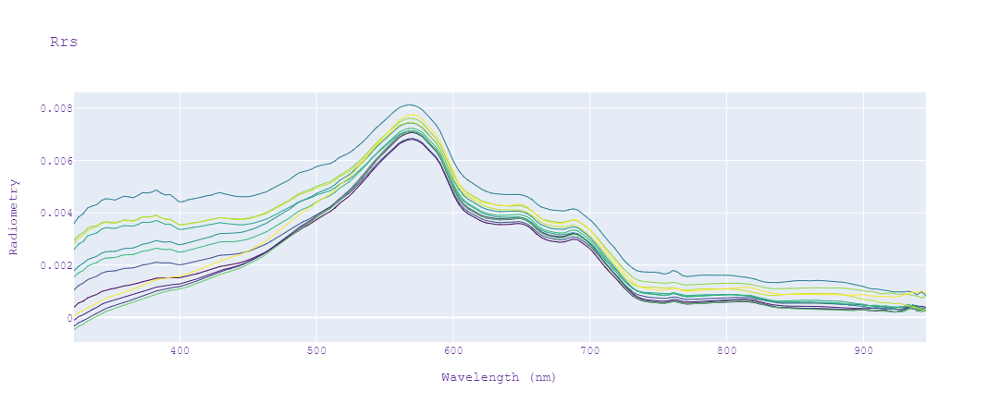

In [27]:
rd.plot(use_subset=True)

In [29]:
rd

Radiometry Rrs:raw with 12/38 (filtered)

## Saving the results

Now we have filtered our radiometries, we can export the results to the text files. As we have already mentioned, the `.txt` files use the same format as the MSDA/TRIOS and are not "user friendly" to be opened in Excel, for example. Hopefuly, we can now export also the interpolated version that is easily opened as a csv file.<br>
Additionally, when we use save method, it can export only the filtered spectra and save the old version in a `.bak` file. <br>
<br>
The files can be saved one at a time or all at once. Let's check what we have in the object and export the reflectance (Rrs) we created earlier.<br>
To verify the object contents, it is enough to type its name in a cell:

In [28]:
rd.save(use_subset=True, save_backup=True)

# RadiometryGroup class

The Radiometry class is able to open multiple radiometries referred to the same measurement. It looks automatically for the following suffixes `['.txt', '.csv', '.mlb']`

In [33]:
from RadiometryTrios import RadiometryGroup, BaseRadiometry

In [59]:
rd = RadiometryGroup.open_folder(folder='../mdbs/20151114-1439/',
                                 prefixes=['Rrs', 'Ed', 'Ld', 'Lu'],
                                 base_name='_spectrum_LO')

06:39:44 INFO:Metadata file not found in ..\mdbs\20151114-1439


In [60]:
rd.times_range()

('2015-11-14 14:39:45', '2015-11-14 14:45:55')

## Accessing the radiometries

In [61]:
df = rd['Ed']
df.head(3)

,306.02905791128,309.36307445507003,312.69773530624,316.03302990125,319.36894767656,322.70547806863,326.04261051392,329.38033444889,332.71863931,336.05751453371005,...,1122.89648919209,1126.06871875,1129.23898342091,1132.40727264128,1135.5735758475698,1138.73788247624,1141.90018196375,1145.06046374656,NaN.4,NaN.5
DateTime,,,,,,,,,,,,,,,,,,,,,
2015-11-14 14:39:45,-NAN,-NAN,-NAN,-NAN,234.149624,300.382603,363.859881,417.886308,442.369263,465.859901,...,-NAN,-NAN,-NAN,-NAN,-NAN,-NAN,-NAN,-NAN,Ed deck,2572_2015-11-14_14-39-45_755_759
2015-11-14 14:39:55,-NAN,-NAN,-NAN,-NAN,204.368246,263.216337,319.263288,361.577456,381.365462,401.640190,...,-NAN,-NAN,-NAN,-NAN,-NAN,-NAN,-NAN,-NAN,Ed deck,2572_2015-11-14_14-39-55_755_773
2015-11-14 14:40:05,-NAN,-NAN,-NAN,-NAN,234.689686,297.204901,363.569637,413.336609,436.606364,460.319149,...,-NAN,-NAN,-NAN,-NAN,-NAN,-NAN,-NAN,-NAN,Ed deck,2572_2015-11-14_14-40-05_755_787


## Plotting spectra

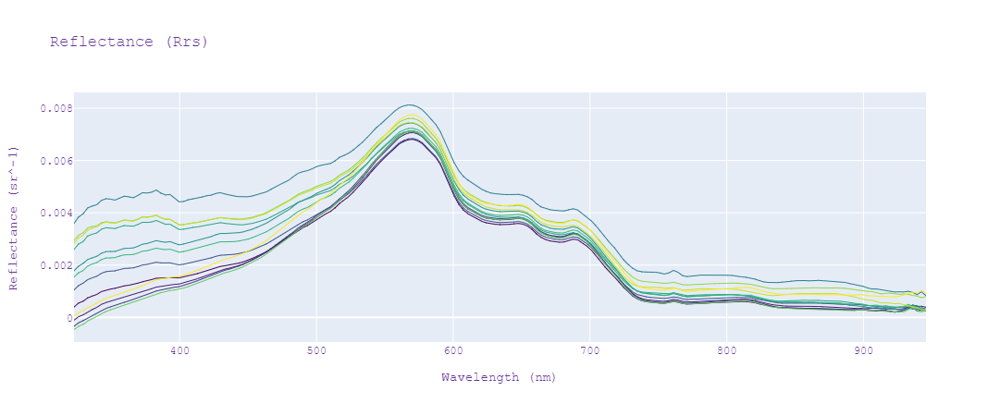

In [63]:
rd.plot_radiometry('Rrs', interpolated=False)

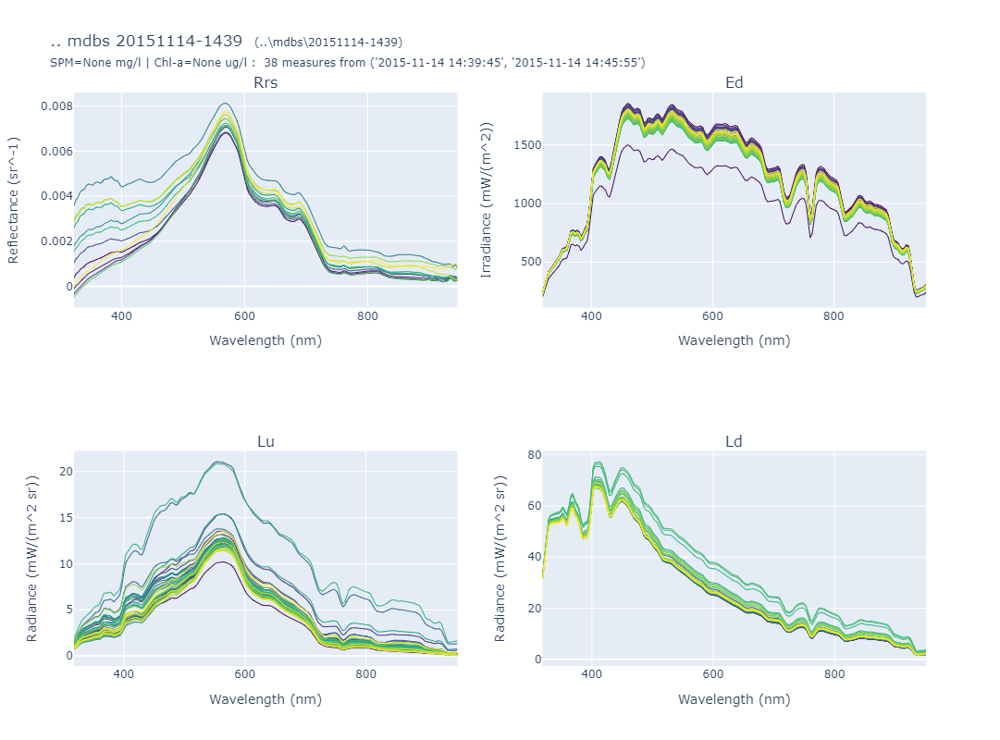

In [64]:
rd.plot_radiometries(interpolated=False, )

The radiometry can also plot the mean spectrum with upper and lower bands shifted by <b>X</b> standard deviations.

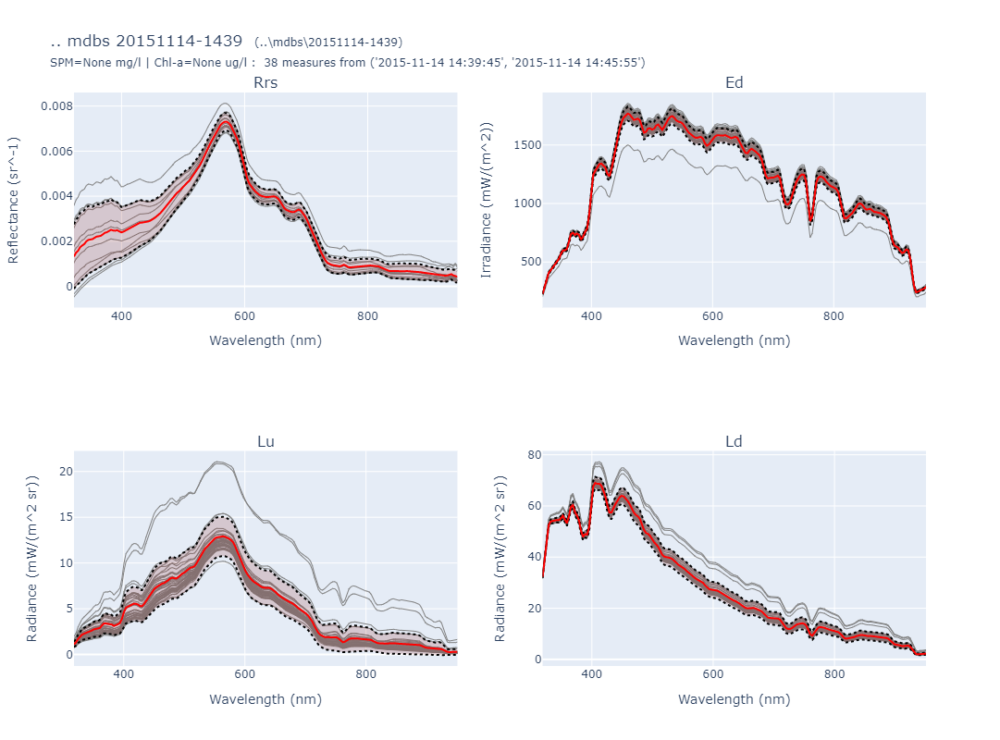

In [65]:
rd.plot_radiometries(mean=True, std_delta=1., interpolated=False)

## When there is no reflectance

It is common not to have the reflectance generated in the MDB file, and we have to do it internally. In this case, we will open only the radiance Ed and radiances Lu and Ld. 

In [78]:
rd = RadiometryGroup.open_folder(folder='../mdbs/20151114-1439',
                                 prefixes=['Ed', 'Ld', 'Lu'],
                                 base_name='_spectrum_LO')

06:43:09 INFO:Metadata file not found in ..\mdbs\20151114-1439


After loading the irradiance (Ed) and radiances (Ld and Lu), we are able to calculate the reflectance. The following formula will be used:<br>
$\displaystyle Rrs = \frac{Lu-\rho Ld}{Ed}$, where $\rho$ is a constant that can be adjusted during the method call. <br>
The names for the loaded radiometries have to be passed. If Ld is not passed, it is calculated only with Lu and Ed. <br><br>
<b>OBS:</b> Note, however, that the reflectance is always calculated with interpolated wave lengths. That's because it can happen that the sensors have different hyperspectral bands. The `calc_reflectance` interpolates automatically everything and saves them as new files. 

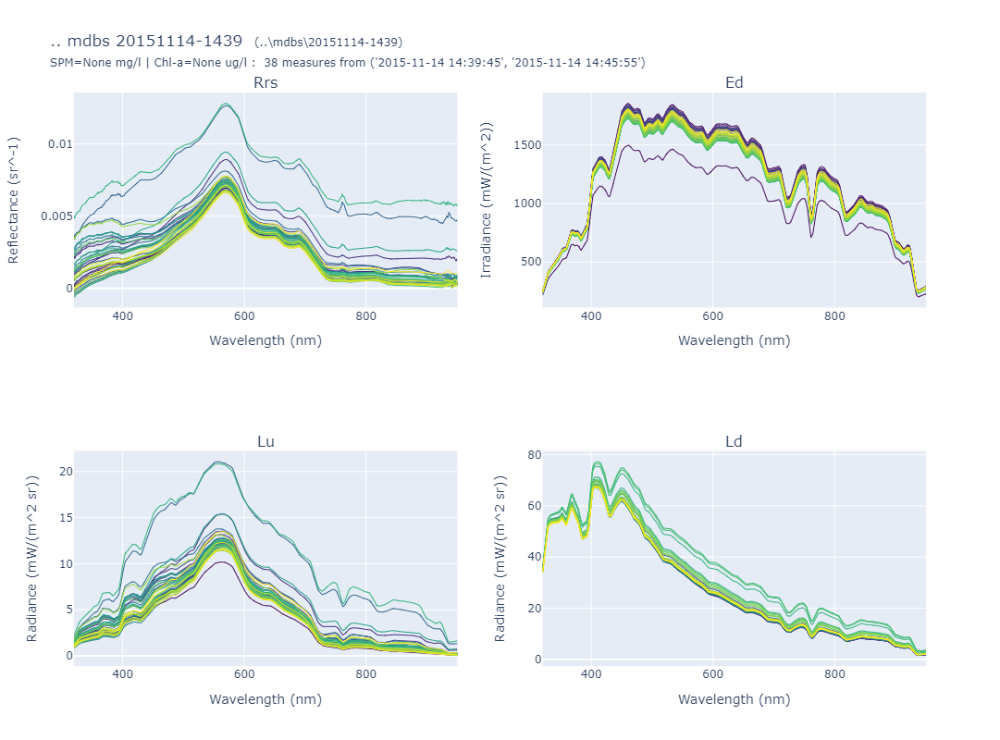

In [79]:
rd.create_reflectance(ed='Ed', ld='Ld', lu='Lu')

rd.plot_radiometries(interpolated=True)

## Filtering/cleaning Data

Data filtering and cleaning in RadiometryGroup class works the same way that has been shown for the Radiometry class. The only difference is that the filters are applied automatically and synchronized through all radiometries.

In [80]:
rd.apply_time_filter(start='2015-11-14 14:42:05', interval=timedelta(minutes=1))

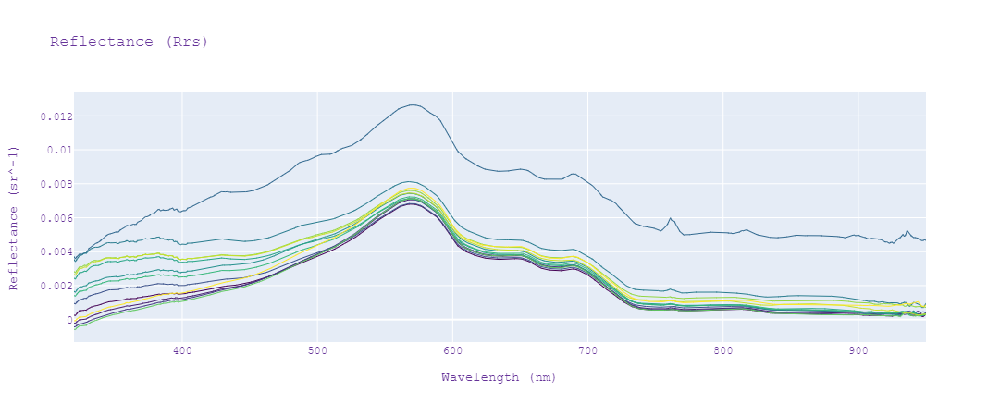

In [81]:
rd.plot_radiometry('Rrs', use_subset=True)

If we want to filter even further, we can accumulate the previous filter (subset) with other filters by value, for example. Note that the subset is applied to all radiometries, and appears in all plots.

In [82]:
rd.apply_value_filter('Rrs', max_value=0.01, accumulate=True)

Radiometry Rrs:raw not available.Loaded: ['Ed', 'Ld', 'Lu']


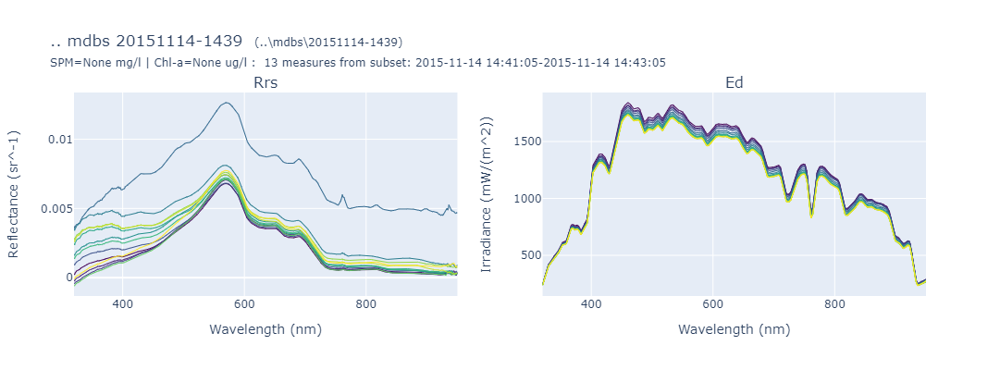

In [83]:
rd.plot_radiometries(['Rrs', 'Ed'], use_subset=True)

## Saving the results

Now we have filtered our radiometries, we can export the results to the text files. As we have already mentioned, the `.txt` files use the same format as the MSDA/TRIOS and are not "user friendly" to be opened in Excel, for example. Hopefuly, we can now export also the interpolated version that is easily opened as a csv file.<br>
Additionally, when we use save method, it can export only the filtered spectra and save the old version in a `.bak` file. <br>
<br>
The files can be saved one at a time or all at once. Let's check what we have in the object and export the reflectance (Rrs) we created earlier.<br>
To verify the object contents, it is enough to type its name in a cell:

In [86]:
rd

Class Radiometry
Raw radiometries: ['Ed', 'Ld', 'Lu'] 
Interpolated radiometries: ['Ed', 'Lu', 'Ld', 'Rrs'] 
Metadata: False
Folder: ..\mdbs\20151114-1439 

In [88]:
rd.get_radiometry('Rrs', interpolated=True).save(use_subset=True, save_backup=True)

File ..\mdbs\20151114-1439\Rrs_interpolated.csv does not exists to be backed up


The message is just to inform that there was no previous file to be backed up.<br>
We can now open this file in excel to see how it looks like.<br>
<b>OBS:</b> Note that the default separator for the CSV is ';' and not ',', but if can be passed as parameter to the save method.<br>
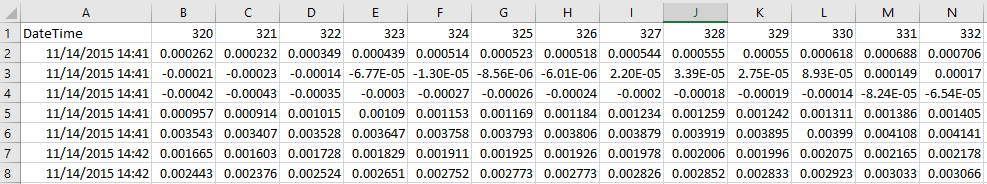

We can notice that we have a very "clean" format and a understandable DateTime column, much different from the format seen in the `.txt` files.<br>
<br>
Now, to save all radiometries at once, we can use the `save_radiometries` method:

In [89]:
rd.save_radiometries(use_subset=True, save_interpolated=True, save_backup=True)

File ..\mdbs\20151114-1439\Ed_interpolated.csv does not exists to be backed up
File ..\mdbs\20151114-1439\Lu_interpolated.csv does not exists to be backed up
File ..\mdbs\20151114-1439\Ld_interpolated.csv does not exists to be backed up


In [90]:
# let's check our directory:
[file for file in rd.folder.iterdir()]

[WindowsPath('../mdbs/20151114-1439/Ed_interpolated.csv'),
 WindowsPath('../mdbs/20151114-1439/Ed_spectrum_LO.bak'),
 WindowsPath('../mdbs/20151114-1439/Ed_spectrum_LO.txt'),
 WindowsPath('../mdbs/20151114-1439/Ld_interpolated.csv'),
 WindowsPath('../mdbs/20151114-1439/Ld_spectrum_LO.bak'),
 WindowsPath('../mdbs/20151114-1439/Ld_spectrum_LO.txt'),
 WindowsPath('../mdbs/20151114-1439/Lu_interpolated.csv'),
 WindowsPath('../mdbs/20151114-1439/Lu_spectrum_LO.bak'),
 WindowsPath('../mdbs/20151114-1439/Lu_spectrum_LO.txt'),
 WindowsPath('../mdbs/20151114-1439/Rrs_interpolated.bak'),
 WindowsPath('../mdbs/20151114-1439/Rrs_interpolated.csv'),
 WindowsPath('../mdbs/20151114-1439/Rrs_spectrum_LO.txt')]

In [92]:
rd = RadiometryGroup.open_folder(rd.folder, load_interpolated=True, read_backup=False)

06:45:23 INFO:Metadata file not found in ..\mdbs\20151114-1439


To save the graphs, we can use the save_radiometries_graph() method. If no folder is provided, the figure is saved in the same folder of the radiometries. Don't forget to pass use_subset 

In [93]:
rd.save_radiometries_graph(folder=None, use_subset=True)

Saving image .._mdbs_20151114-1439.png into: ..\mdbs\20151114-1439
